### Advanced Machine Learning Technologies. Autumn 2022.
### TASK 4. Sorokin Mikhail group J42322c.

In [19]:
from matplotlib import image as mpimg, pyplot as plt
import pandas as pd
import torch
import piq
from skimage.io import imread

# We use NIMA cloned repo for the next import:
from main import rate

In [20]:
# My quality estimations:
user_quality = [3,4,2,5,5,4,5,3,5,5,3,4,2,1,3,1,2,1,2,1]

# Pic names
picture_names = []
for i in range(20):
    picture_names.append('pic' + str(i) + '.jpg')
picture_names

['pic0.jpg',
 'pic1.jpg',
 'pic2.jpg',
 'pic3.jpg',
 'pic4.jpg',
 'pic5.jpg',
 'pic6.jpg',
 'pic7.jpg',
 'pic8.jpg',
 'pic9.jpg',
 'pic10.jpg',
 'pic11.jpg',
 'pic12.jpg',
 'pic13.jpg',
 'pic14.jpg',
 'pic15.jpg',
 'pic16.jpg',
 'pic17.jpg',
 'pic18.jpg',
 'pic19.jpg']

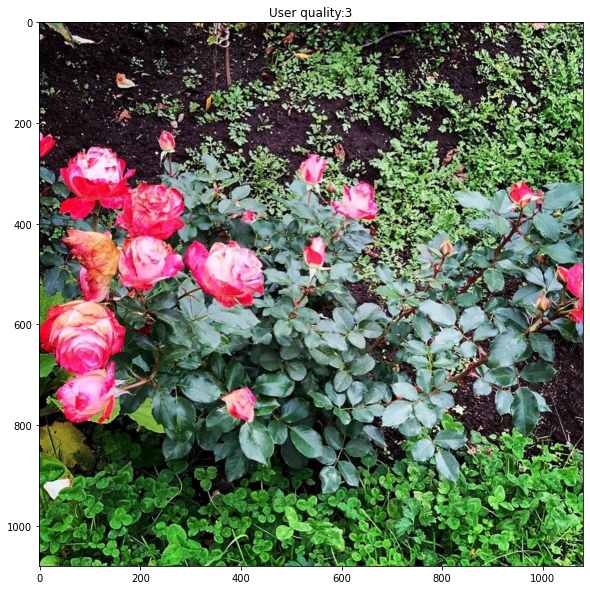

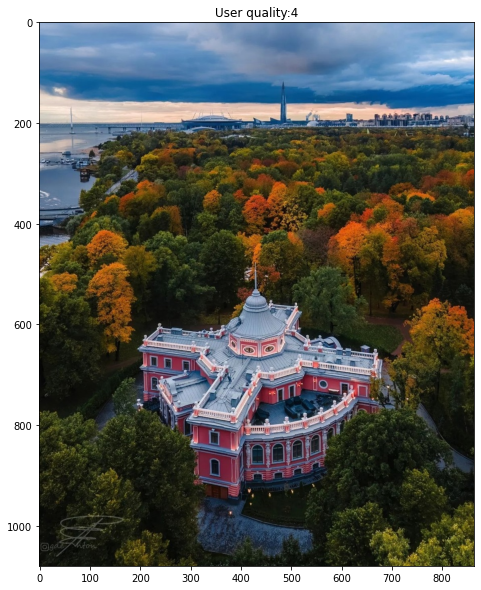

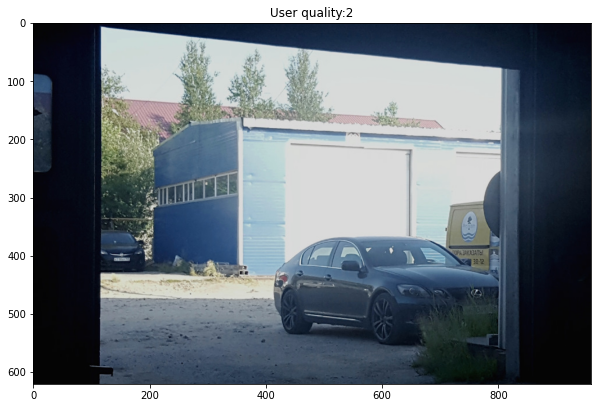

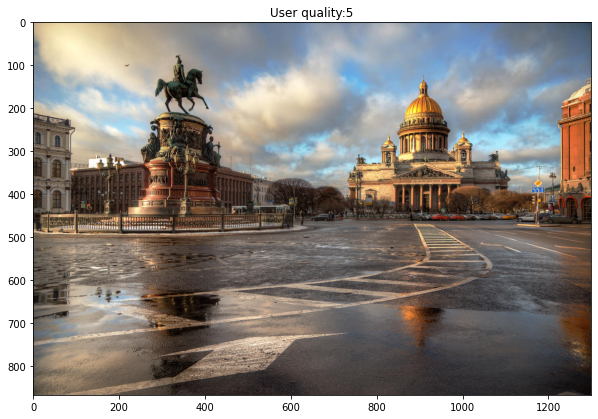

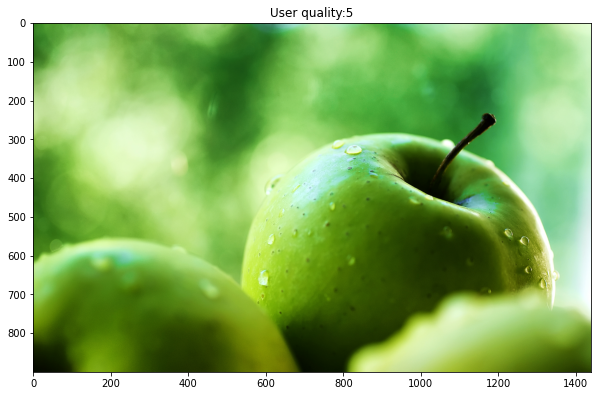

...

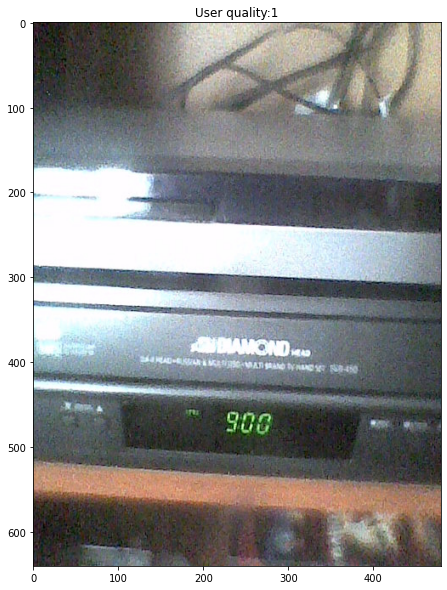

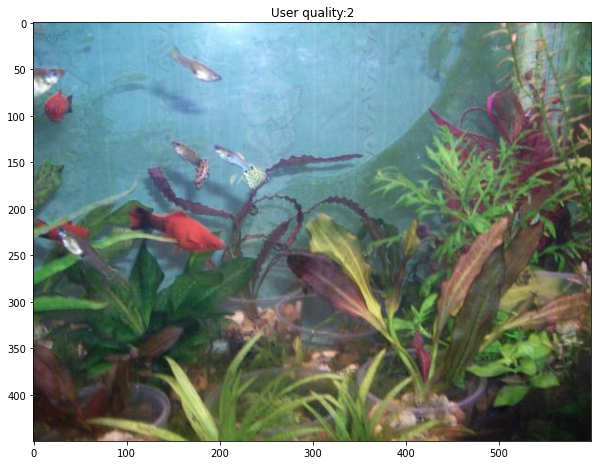

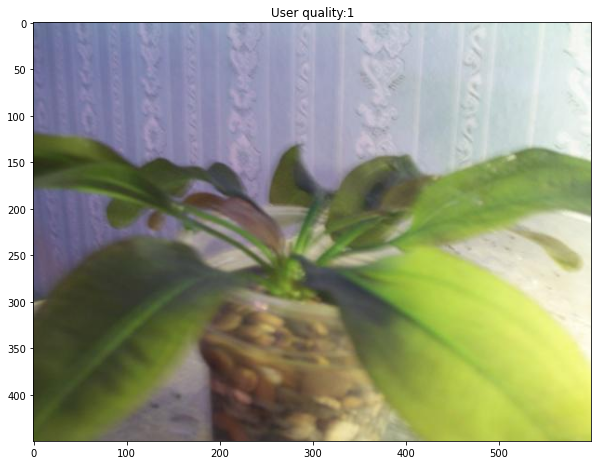

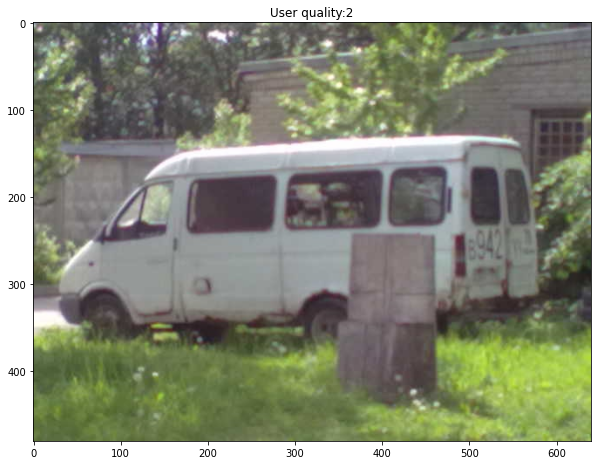

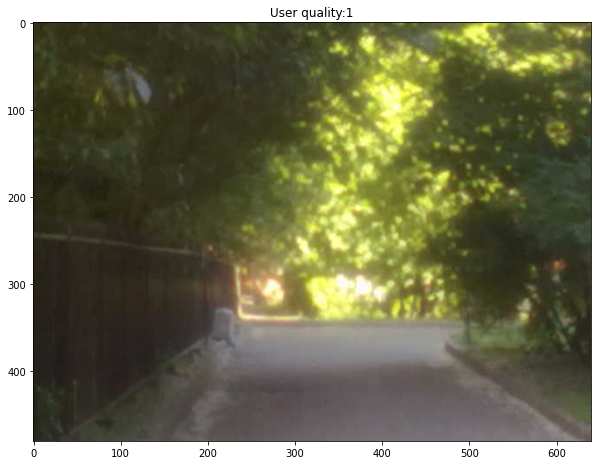

In [21]:
# Let's draw all the pictures
for i, pic in enumerate(picture_names):
    image = mpimg.imread('../lab4_pictures/' + pic)
    plt.figure(figsize=(10,10))
    plt.title('User quality:'+ str(user_quality[i]))
    plt.imshow(image)
    plt.show()

In [22]:
def metrics_eval(full_path, user_quality):
    tens = torch.tensor(imread(full_path)).permute(2, 0, 1)[None, ...] / 255.

    # Use piq lib to get BRISQUE and TV
    tv: torch.Tensor = piq.total_variation(tens)
    brisque: torch.Tensor = piq.brisque(tens, data_range=1., reduction='none')

    scores, mean, std = rate(full_path)

    metrics_eval = {'USER_PERCEPTION' : user_quality,
                    'TV' : tv.item(),
                    'BRISQUE' : brisque.item(),
                    'NIMA_mean' : mean,
                    'NIMA_std' : std}
    return metrics_eval

USER_PERCEPTION: 3 , TV: 262.49542236328125  BRISQUE: 17.77557373046875  NIMA_mean: 5.421708106994629  NIMA_std: 1.4194018840789795


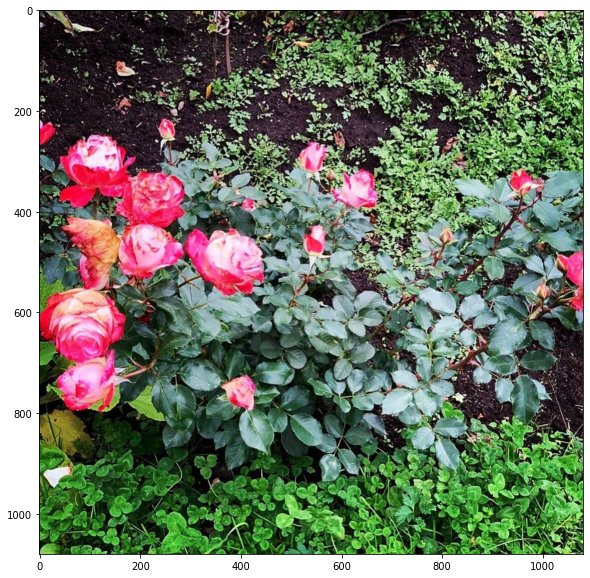

USER_PERCEPTION: 4 , TV: 143.84939575195312  BRISQUE: 6.80487060546875  NIMA_mean: 5.403328895568848  NIMA_std: 1.4134278297424316


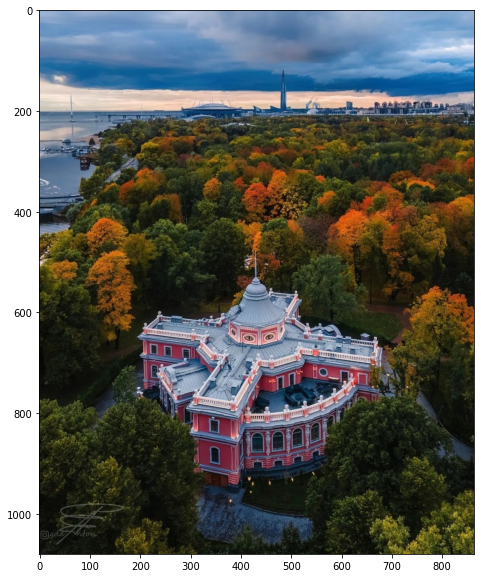

USER_PERCEPTION: 2 , TV: 69.33501434326172  BRISQUE: 17.15447998046875  NIMA_mean: 5.404254913330078  NIMA_std: 1.4080424308776855


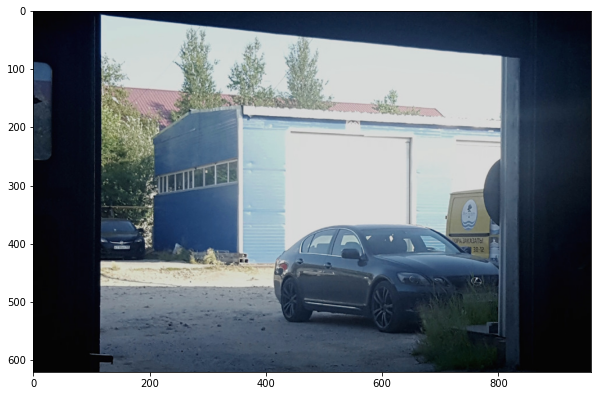

USER_PERCEPTION: 5 , TV: 159.9990234375  BRISQUE: 16.59783935546875  NIMA_mean: 5.399281024932861  NIMA_std: 1.4174007177352905


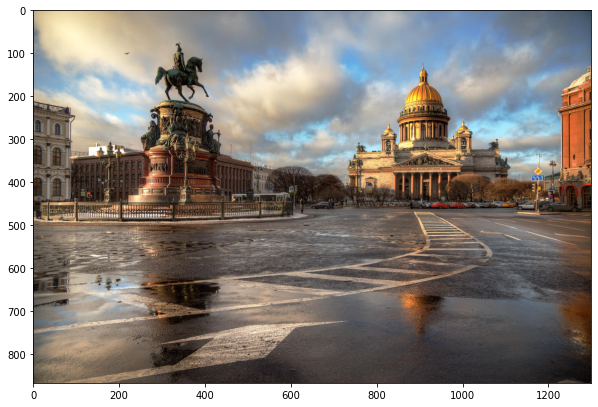

USER_PERCEPTION: 5 , TV: 45.81824493408203  BRISQUE: 9.90936279296875  NIMA_mean: 5.413731575012207  NIMA_std: 1.4154365062713623


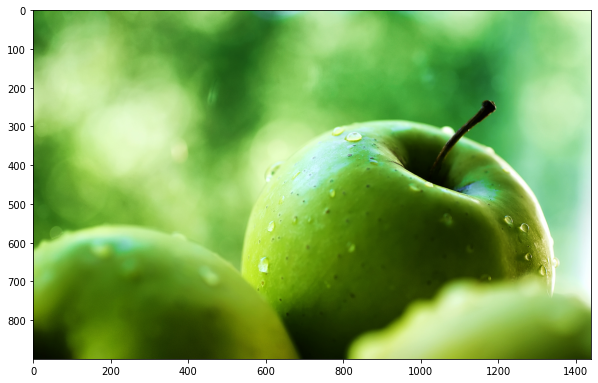

USER_PERCEPTION: 4 , TV: 125.77017211914062  BRISQUE: 21.30682373046875  NIMA_mean: 5.4140119552612305  NIMA_std: 1.4219775199890137


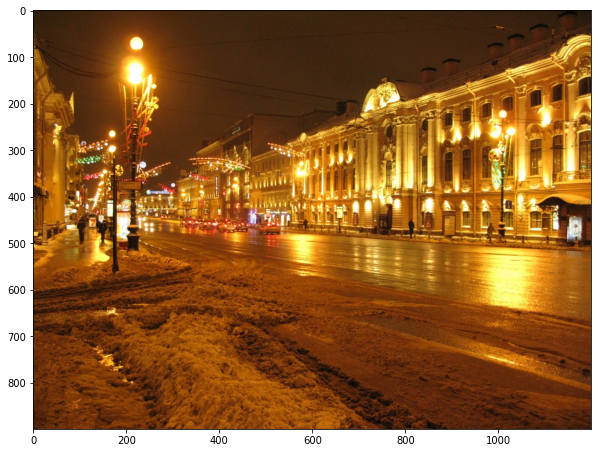

USER_PERCEPTION: 5 , TV: 102.57845306396484  BRISQUE: 26.61102294921875  NIMA_mean: 5.408842086791992  NIMA_std: 1.4052892923355103


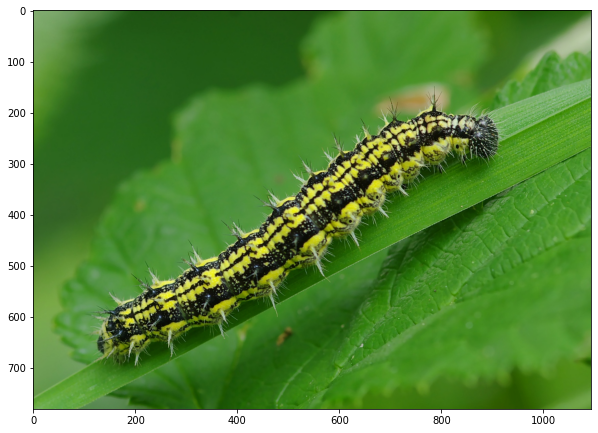

USER_PERCEPTION: 3 , TV: 208.12266540527344  BRISQUE: 19.88494873046875  NIMA_mean: 5.430383205413818  NIMA_std: 1.4080374240875244


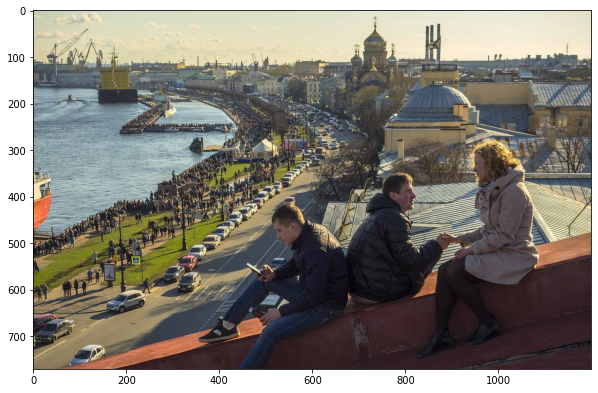

USER_PERCEPTION: 5 , TV: 129.9122772216797  BRISQUE: -1.51690673828125  NIMA_mean: 5.408603668212891  NIMA_std: 1.413956642150879


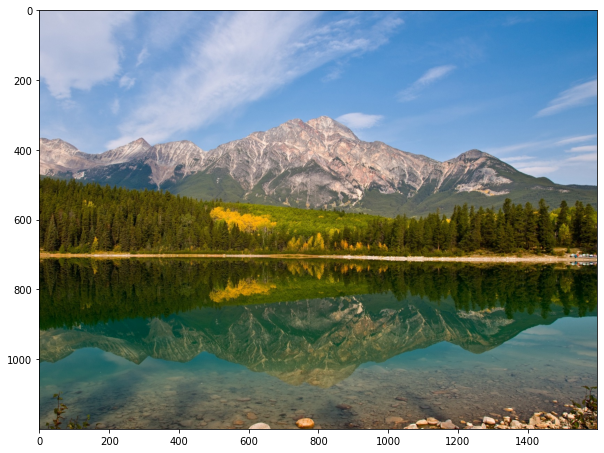

USER_PERCEPTION: 5 , TV: 71.0221939086914  BRISQUE: 17.35467529296875  NIMA_mean: 5.442412853240967  NIMA_std: 1.4497843980789185


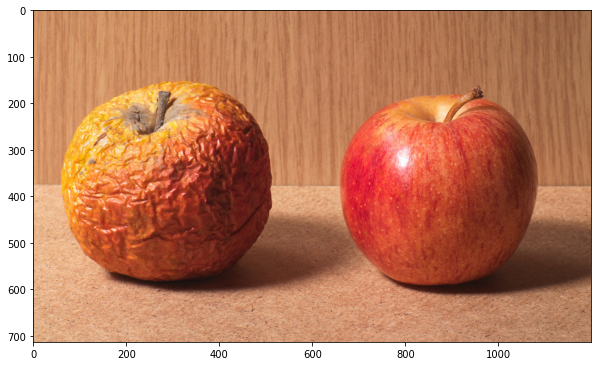

USER_PERCEPTION: 3 , TV: 179.9602508544922  BRISQUE: 3.00701904296875  NIMA_mean: 5.3979668617248535  NIMA_std: 1.419403314590454


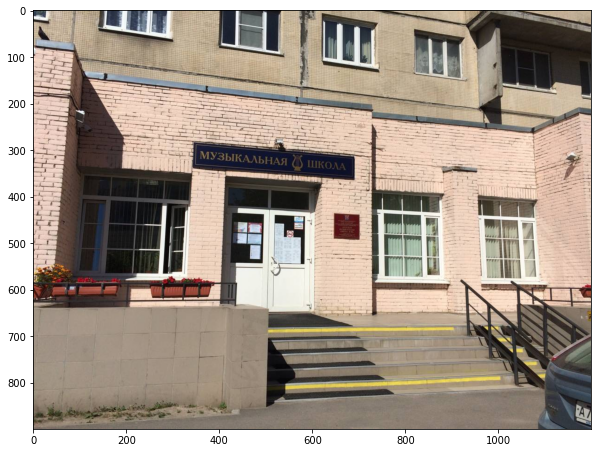

USER_PERCEPTION: 4 , TV: 174.3592071533203  BRISQUE: 8.57586669921875  NIMA_mean: 5.422557830810547  NIMA_std: 1.417595386505127


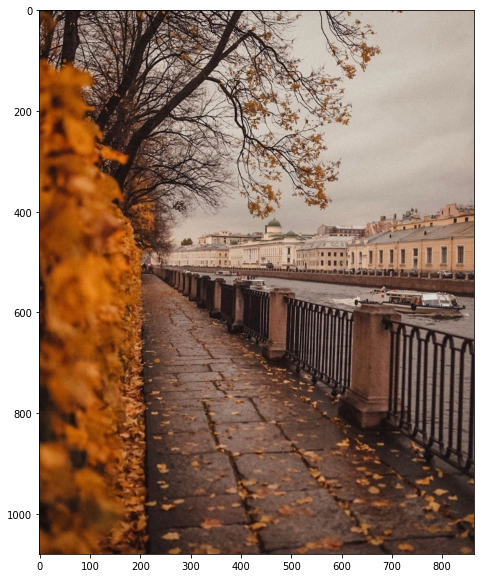

USER_PERCEPTION: 2 , TV: 182.0058135986328  BRISQUE: 12.88885498046875  NIMA_mean: 5.416540622711182  NIMA_std: 1.4456546306610107


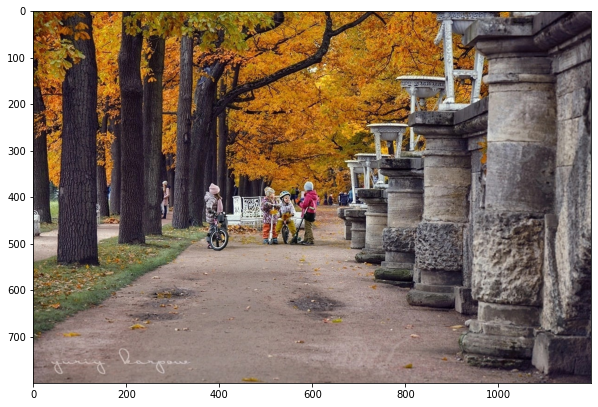

USER_PERCEPTION: 1 , TV: 31.938037872314453  BRISQUE: 56.78582763671875  NIMA_mean: 5.413600921630859  NIMA_std: 1.4757260084152222


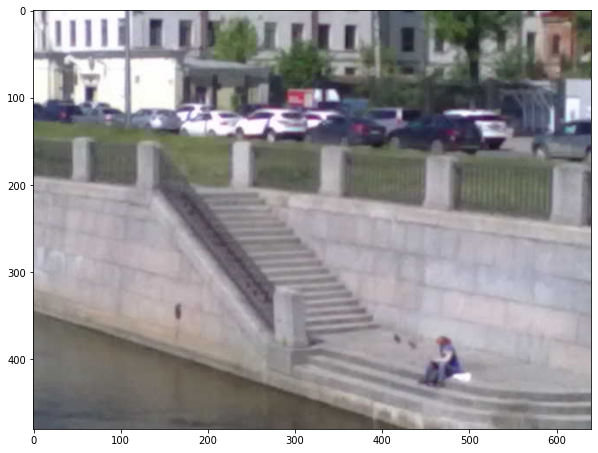

USER_PERCEPTION: 3 , TV: 174.35104370117188  BRISQUE: 27.16961669921875  NIMA_mean: 5.417884826660156  NIMA_std: 1.4053133726119995


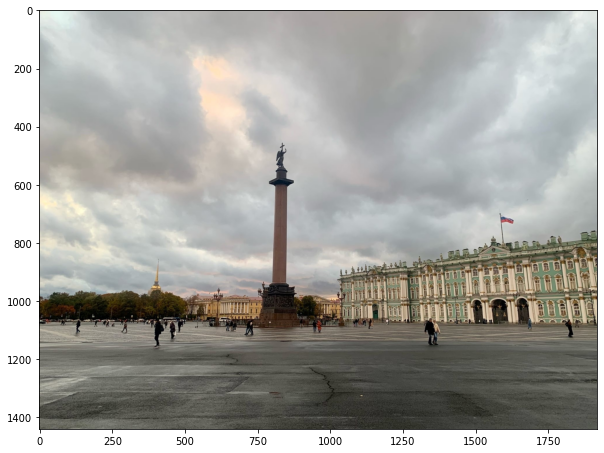

USER_PERCEPTION: 1 , TV: 62.20453643798828  BRISQUE: 11.52166748046875  NIMA_mean: 5.416533470153809  NIMA_std: 1.4525763988494873


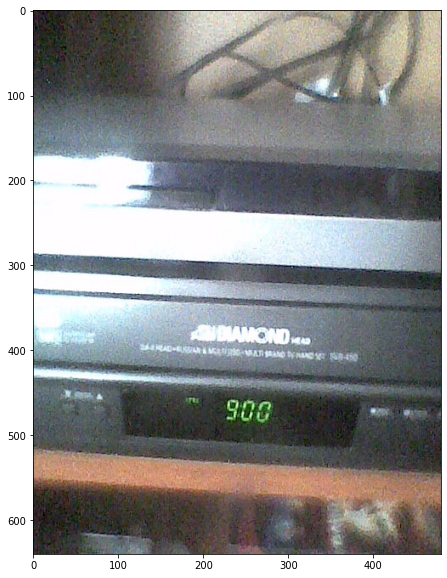

USER_PERCEPTION: 2 , TV: 36.94651412963867  BRISQUE: 28.49871826171875  NIMA_mean: 5.426865577697754  NIMA_std: 1.4204879999160767


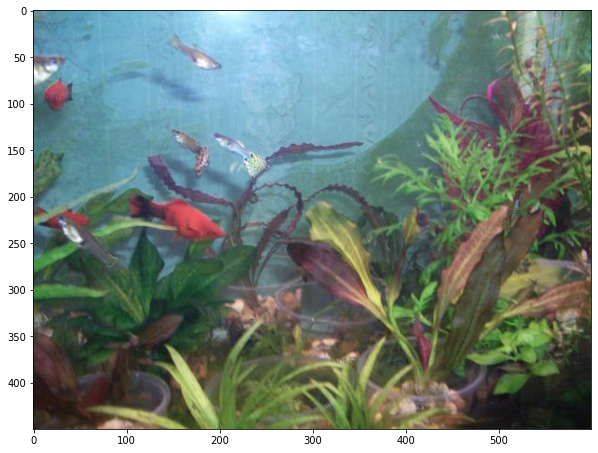

USER_PERCEPTION: 1 , TV: 16.27255630493164  BRISQUE: 26.05340576171875  NIMA_mean: 5.419179916381836  NIMA_std: 1.4180690050125122


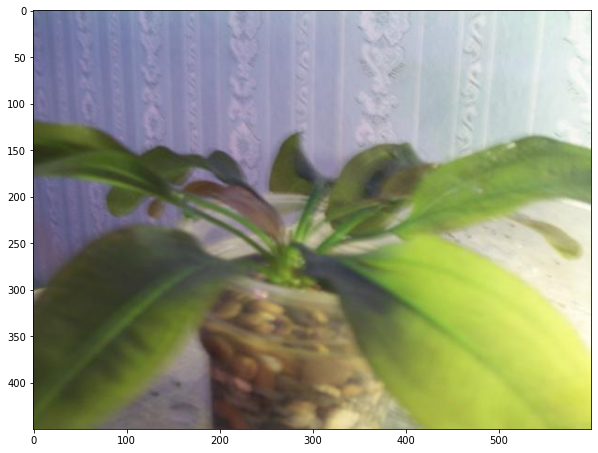

USER_PERCEPTION: 2 , TV: 29.898130416870117  BRISQUE: 53.78436279296875  NIMA_mean: 5.406523704528809  NIMA_std: 1.4354500770568848


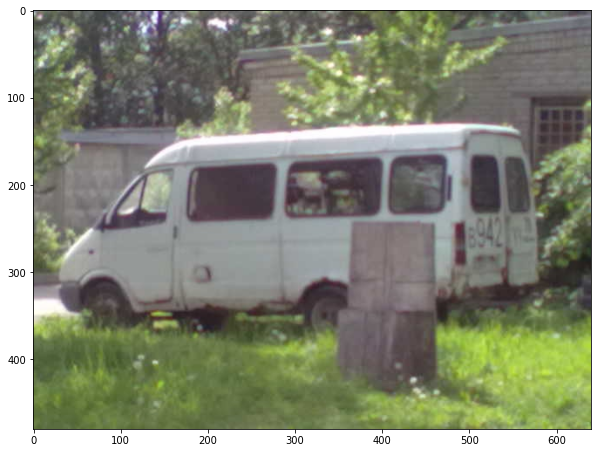

USER_PERCEPTION: 1 , TV: 20.962739944458008  BRISQUE: 48.35565185546875  NIMA_mean: 5.401134490966797  NIMA_std: 1.4068342447280884


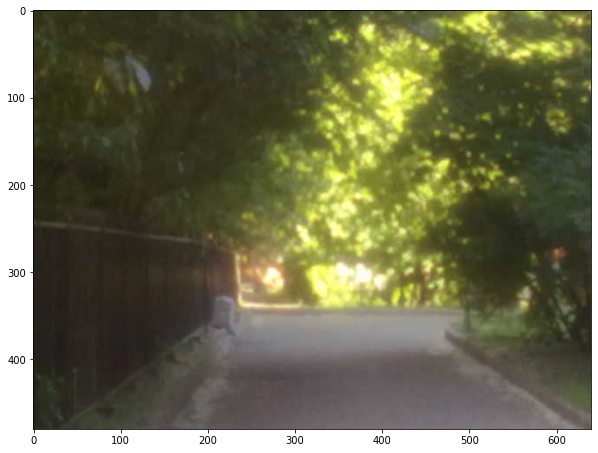

In [23]:
results = []
for i, pic in enumerate(picture_names):
    full_path = "../lab4_pictures/" + pic
    all_metrics = metrics_eval(full_path, user_quality[i])
    results.append(all_metrics)
    plt.figure(figsize=(10,10))
    img = mpimg.imread(full_path)
    print('USER_PERCEPTION:',user_quality[i],', TV:',all_metrics['TV'],' BRISQUE:',all_metrics['BRISQUE'],' NIMA_mean:',all_metrics['NIMA_mean'],' NIMA_std:',all_metrics['NIMA_std'])
    plt.imshow(img)
    plt.show()

In [24]:
df = pd.DataFrame(results)
df.corr()

,USER_PERCEPTION,TV,BRISQUE,NIMA_mean,NIMA_std
USER_PERCEPTION,1.000000,0.372272,-0.540036,0.050879,-0.340273
TV,0.372272,1.000000,-0.525101,0.065251,-0.278097
BRISQUE,-0.540036,-0.525101,1.000000,-0.037569,0.300086
NIMA_mean,0.050879,0.065251,-0.037569,1.000000,0.266957
NIMA_std,-0.340273,-0.278097,0.300086,0.266957,1.000000


In [25]:
# Seems like the TV quality metric is the closest to my quality perception. Correlation shows that TV is actually is the only
# choice when considering a similiar quality estimation for the given pictures and my marks to them.